# System Recommendation Books

## Background

Di era informasi yang berkembang pesat, dunia literasi menghadapi tantangan baru. Setiap hari, ribuan buku baru diterbitkan di seluruh dunia, mencakup berbagai genre, topik, dan gaya penulisan. Bagi pembaca, keberlimpahan pilihan ini bukannya mempercepat pencarian bacaan, justru seringkali menimbulkan kebingungan: "Buku apa yang sebaiknya saya baca selanjutnya?"

Berangkat dari permasalahan ini, lahirlah ide untuk membangun sebuah Sistem Rekomendasi Buku. Tujuan utamanya sederhana namun krusial: membantu pembaca menemukan buku yang sesuai dengan minat, kebiasaan membaca, dan preferensi pribadi mereka dengan cepat dan tepat.


## Importing Library

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from pathlib import Path
import matplotlib.pyplot as plt

In [1]:
!pip install opendatasets
import opendatasets as od

od.download('https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Books.csv')

Skipping, found downloaded files in "./book-recommendation-dataset" (use force=True to force download)


In [2]:
import pandas as pd

books = pd.read_csv('/content/book-recommendation-dataset/Books.csv')
ratings = pd.read_csv('/content/book-recommendation-dataset/Ratings.csv')
users = pd.read_csv('/content/book-recommendation-dataset/Users.csv')

<ipython-input-2-7c7983d6b263>:3: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('/content/book-recommendation-dataset/Books.csv')


## Data Understading

In [4]:
def list_desc_dataframe(df):
  ListofDecs = []

  for col in df.columns:
    ListofDecs.append([col, df[col].dtype, df[col].isna().sum(), df[col].nunique(), df[col].unique()[:5]])

  df_decs = pd.DataFrame(ListofDecs, columns=['column', 'type', 'null', 'number of unique value', 'sample unique value'])
  return df_decs

### Dataset Books

In [5]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [6]:
books_decs = list_desc_dataframe(books)
books_decs

,column,type,null,number of unique value,sample unique value
0,ISBN,object,0,271360,"[0195153448, 0002005018, 0060973129, 037415706..."
1,Book-Title,object,0,242135,"[Classical Mythology, Clara Callan, Decision i..."
2,Book-Author,object,2,102022,"[Mark P. O. Morford, Richard Bruce Wright, Car..."
3,Year-Of-Publication,object,0,202,"[2002, 2001, 1991, 1999, 2000]"
4,Publisher,object,2,16807,"[Oxford University Press, HarperFlamingo Canad..."
5,Image-URL-S,object,0,271044,[http://images.amazon.com/images/P/0195153448....
6,Image-URL-M,object,0,271044,[http://images.amazon.com/images/P/0195153448....
7,Image-URL-L,object,3,271041,[http://images.amazon.com/images/P/0195153448....


In [7]:
print(f'Jumlah banyak data: {books.shape[0]}')

Jumlah banyak data: 271360


Berdasarkan output diatas dataset `Books.csv` memiliki data sebanyak **271360 baris** dengan terdiri dari **8 kolom**

Berikut penjelasan singkat untuk setiap kolom:

1. **ISBN**: Nomor identifikasi unik untuk setiap buku.
2. **Book-Title**: Judul buku.
3. **Book-Author**: Nama penulis buku.
4. **Year-Of-Publication**: Tahun terbit buku.
5. **Publisher**: Nama penerbit buku.
6. **Image-URL-S**: URL gambar sampul buku resolusi kecil.
7. **Image-URL-M**: URL gambar sampul buku resolusi sedang.
8. **Image-URL-L**: URL gambar sampul buku resolusi besar.

Terdapat 2-3 missing value pada kolom `Book-Author`, `Publisher`, & `Image-URL-L`.

### Dataset Ratings

In [8]:
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [9]:
ratings_decs = list_desc_dataframe(ratings)
ratings_decs

,column,type,null,number of unique value,sample unique value
0,User-ID,int64,0,105283,"[276725, 276726, 276727, 276729, 276733]"
1,ISBN,object,0,340556,"[034545104X, 0155061224, 0446520802, 052165615..."
2,Book-Rating,int64,0,11,"[0, 5, 3, 6, 8]"


In [10]:
print(f'Jumlah banyak data: {ratings.shape[0]}')

Jumlah banyak data: 1149780


Berdasarkan output diatas dataset `Ratings.csv` memiliki data sebanyak **1149780 baris** dengan terdiri dari **3 kolom**

Berikut penjelasan singkat untuk setiap kolom:

1. **User-ID**: Kode unik dari setiap users.
2. **ISBN**: Nomor identifikasi unik untuk setiap buku.
3. **Book-Rating**: Rating dari setiap buku yang diberikan oleh user.

Pada dataset ini tidak terdapat null values

In [11]:
df_percentage = ratings.groupby('Book-Rating').size().reset_index(name='Count')
df_percentage['Percentage'] = round((df_percentage['Count']/df_percentage['Count'].sum())*100,2)
df_percentage

,Book-Rating,Count,Percentage
0,0,716109,62.28
1,1,1770,0.15
2,2,2759,0.24
3,3,5996,0.52
4,4,8904,0.77
5,5,50974,4.43
6,6,36924,3.21
7,7,76457,6.65
8,8,103736,9.02
9,9,67541,5.87


Text(0.5, 1.0, 'Persentase Rating Buku')

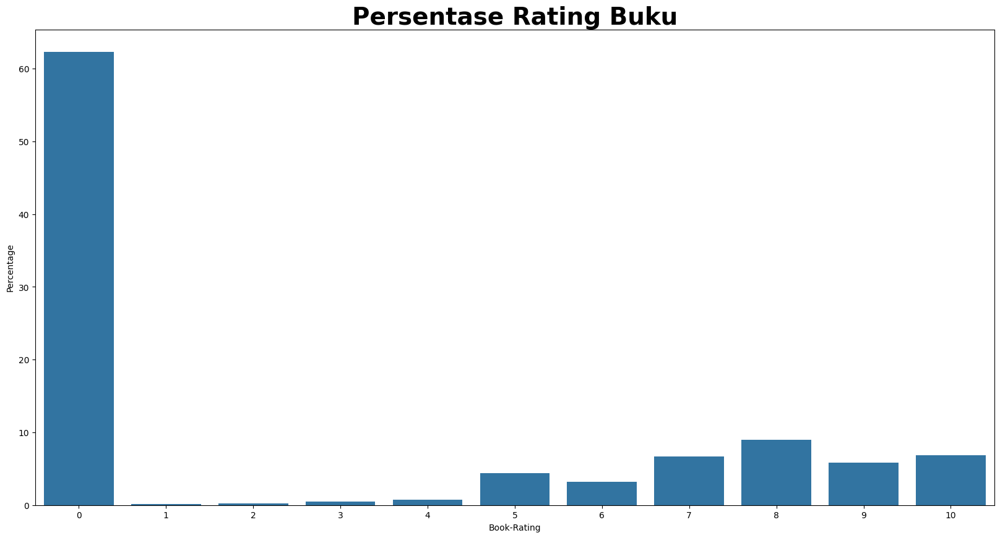

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20,10))
sns.barplot(data=df_percentage, x='Book-Rating', y='Percentage')
plt.title('Persentase Rating Buku', fontsize=28, weight='bold')

### Dataset Users

In [13]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [14]:
users_decs = list_desc_dataframe(users)
users_decs

,column,type,null,number of unique value,sample unique value
0,User-ID,int64,0,278858,"[1, 2, 3, 4, 5]"
1,Location,object,0,57339,"[nyc, new york, usa, stockton, california, usa..."
2,Age,float64,110762,165,"[nan, 18.0, 17.0, 61.0, 26.0]"


In [15]:
print(f'Jumlah banyak data: {users.shape[0]}')

Jumlah banyak data: 278858


Berdasarkan output diatas dataset `Users.csv` memiliki data sebanyak **278858 baris** dengan terdiri dari **3 kolom**

Berikut penjelasan singkat untuk setiap kolom:

1. **User-ID**: Kode unik dari setiap users.
2. **Location**: Lokasi dari setiap users berada/tinggal
3. **Age**: Umur dari setiap user.

Terdapat 110762 missing values pada kolom `Age`.

## Data Preparation

### Merge Dataframe

In [16]:
# Menggabungkan dataframe seluruh data frame
books_ratings = pd.merge(books, ratings, on='ISBN', how='left')
all = pd.merge(books_ratings, users, on='User-ID', how='left')
all.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2.0,0.0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8.0,5.0,"timmins, ontario, canada",NaN
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400.0,0.0,"ottawa, ontario, canada",49.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676.0,8.0,"n/a, n/a, n/a",NaN
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385.0,0.0,"sudbury, ontario, canada",NaN


Kolom yang akan kita gunakan pada case kali ini hanya `ISBN`, `Book-Title`, `Book-Author`, `Publisher`, `User-ID`, & `Book-Rating`

In [17]:
all = all[['ISBN', 'Book-Title', 'Book-Author', 'Publisher', 'User-ID', 'Book-Rating']]
all.head()

,ISBN,Book-Title,Book-Author,Publisher,User-ID,Book-Rating
0,0195153448,Classical Mythology,Mark P. O. Morford,Oxford University Press,2.0,0.0
1,0002005018,Clara Callan,Richard Bruce Wright,HarperFlamingo Canada,8.0,5.0
2,0002005018,Clara Callan,Richard Bruce Wright,HarperFlamingo Canada,11400.0,0.0
3,0002005018,Clara Callan,Richard Bruce Wright,HarperFlamingo Canada,11676.0,8.0
4,0002005018,Clara Callan,Richard Bruce Wright,HarperFlamingo Canada,41385.0,0.0


In [18]:
all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1032345 entries, 0 to 1032344
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   ISBN         1032345 non-null  object 
 1   Book-Title   1032345 non-null  object 
 2   Book-Author  1032343 non-null  object 
 3   Publisher    1032343 non-null  object 
 4   User-ID      1031136 non-null  float64
 5   Book-Rating  1031136 non-null  float64
dtypes: float64(2), object(4)
memory usage: 47.3+ MB


### Drop Missing Values

In [19]:
all.isna().sum()

,0
ISBN,0
Book-Title,0
Book-Author,2
Publisher,2
User-ID,1209
Book-Rating,1209


Terdapat nilai null pada kolom `Book-Author` dan `Publisher` sebanyak 2 data. Karena jumlahnya sangat sedikit dibandingkan total 1.032.345 baris, maka sebaiknya baris tersebut dihapus. Selain itu, kolom `User-ID` dan `Book-Rating` juga memiliki nilai null. Mengingat sistem rekomendasi sangat bergantung pada informasi `User-ID` (siapa yang memberi rating) dan `Book-Rating` (nilai yang diberikan), maka data yang tidak memiliki nilai pada kolom tersebut tidak dapat digunakan dan juga harus dihapus.

In [20]:
# Menghapus null values
all.dropna(inplace=True)

all.isna().sum()

,0
ISBN,0
Book-Title,0
Book-Author,0
Publisher,0
User-ID,0
Book-Rating,0


### Drop Invalid Values

In [21]:
all['Book-Rating'].value_counts()

,count
Book-Rating,
0.0,647294
8.0,91803
10.0,71224
7.0,66402
9.0,60776
5.0,45355
6.0,31687
4.0,7617
3.0,5118


Pada kolom `Book-Rating`, terdapat nilai 0 yang jumlahnya sangat besar. Nilai tersebut harus dihapus karena beberapa alasan:  
- Merupakan **bukan preferensi nyata** dari pengguna (biasanya menunjukkan bahwa pengguna tidak memberikan rating).  
- **Tidak berguna** dalam sistem rekomendasi berbasis rating, baik **collaborative filtering** maupun **content-based filtering**.  
- Jumlahnya yang sangat dominan dapat **menyebabkan bias** dalam pelatihan model.


In [22]:
all = all[all['Book-Rating'] != 0]

In [23]:
all.sort_values('User-ID', ascending=True)

,ISBN,Book-Title,Book-Author,Publisher,User-ID,Book-Rating
1,0002005018,Clara Callan,Richard Bruce Wright,HarperFlamingo Canada,8.0,5.0
91,1567407781,The Witchfinder (Amos Walker Mystery Series),Loren D. Estleman,Brilliance Audio - Trade,8.0,6.0
80,0887841740,The Middle Stories,Sheila Heti,House of Anansi Press,8.0,5.0
82,1552041778,Jane Doe,R. J. Kaiser,Mira Books,8.0,5.0
95,1881320189,Goodbye to the Buttermilk Sky,Julia Oliver,River City Pub,8.0,7.0
...,...,...,...,...,...,...
262048,0375703063,A Virtuous Woman (Oprah's Book Club (Paperback)),Kaye Gibbons,Vintage Books,278854.0,7.0
254461,0316184152,Final Harvest : Poems,Emily Dickinson,Back Bay Books,278854.0,7.0
744956,0553275739,In Her Day,Rita Mae Brown,Bantam Books,278854.0,6.0
795461,0425163393,Kat Scratch Fever (Kat Colorado Mysteries),Karen Kijewski,Berkley Publishing Group,278854.0,7.0


In [24]:
all.groupby('Book-Title').agg({
    'Book-Title' : 'count',
    'Book-Rating' : 'mean'
}).rename(columns={'Book-Title': 'Number Reads'}).sort_values(by=['Book-Rating', 'Number Reads'], ascending=[True, False])

,Number Reads,Book-Rating
Book-Title,,
Raising Positive Kids in a Negative World,2,1.0
The Birth of Christianity : Discovering What Happened In the Years Immediately After the Execution Of Jesus,2,1.0
1848: The Revolutionary Tide in Europe (Revolutions in the Modern World),1,1.0
A Dangerous Liaison,1,1.0
"A Poet's Guide to Poetry (Chicago Guides to Writing, Editing, and Publishing)",1,1.0
...,...,...
touch the flame,1,10.0
"Â¡Corre, perro, corre!",1,10.0
Ã? sucesso solo 50 anni fa: Lo sterminio di sei milioni di Ebrei,1,10.0


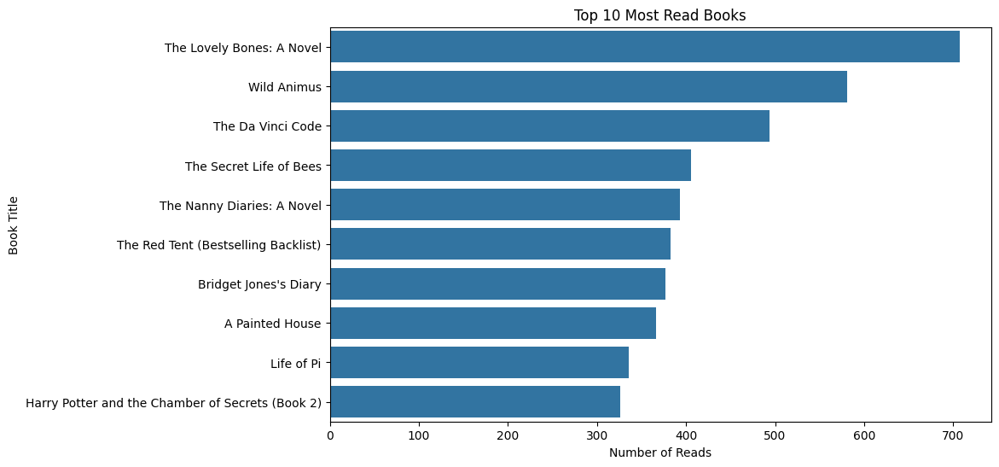

In [25]:
# Count most frequent genres
top_book = all['Book-Title'].value_counts().head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=top_book.values, y=top_book.index)
plt.title('Top 10 Most Read Books')
plt.xlabel('Number of Reads')
plt.ylabel('Book Title')
plt.show()

In [26]:
all.isna().sum()

,0
ISBN,0
Book-Title,0
Book-Author,0
Publisher,0
User-ID,0
Book-Rating,0


### Encoding Data

In [27]:
# Mengubah kolom User-ID menjadi list tanpa nilai yang sama
user_id = all['User-ID'].unique().tolist()
print(f'list User-ID: {user_id}')

# Melakukan encoding User-ID
id_to_id_encoded = {x: i for i, x in enumerate(user_id)}
print(f'encoded User-ID: {id_to_id_encoded}')

# Melakukan proses encoding angka ke User-ID
id_encoded_to_id = {i: x for i, x in enumerate(user_id)}
print(f'encoded angka ke User-ID: {id_encoded_to_id}')

list User-ID: [8.0, 11676.0, 67544.0, 116866.0, 123629.0, 200273.0, 210926.0, 219008.0, 263325.0, 2954.0, 152827.0, 35704.0, 110912.0, 157969.0, 192665.0, 197659.0, 208059.0, 29526.0, 46398.0, 49635.0, 67958.0, 115097.0, 148712.0, 178269.0, 194722.0, 198013.0, 212449.0, 213191.0, 230522.0, 238557.0, 245827.0, 252921.0, 255661.0, 52614.0, 189238.0, 61501.0, 148514.0, 263256.0, 226745.0, 3329.0, 7346.0, 7352.0, 9419.0, 11224.0, 12685.0, 12923.0, 13552.0, 20801.0, 20916.0, 21264.0, 23511.0, 26240.0, 27684.0, 28123.0, 30533.0, 31299.0, 31315.0, 31560.0, 38718.0, 38991.0, 44663.0, 45585.0, 46389.0, 46767.0, 48911.0, 49168.0, 54005.0, 54884.0, 55027.0, 57423.0, 57632.0, 62667.0, 64535.0, 66387.0, 67487.0, 68537.0, 70666.0, 72975.0, 75691.0, 75819.0, 78165.0, 78754.0, 78973.0, 79740.0, 82114.0, 84611.0, 85534.0, 86969.0, 88006.0, 93055.0, 93643.0, 93772.0, 93800.0, 94139.0, 98923.0, 100393.0, 101209.0, 105124.0, 105979.0, 106230.0, 107784.0, 108143.0, 108247.0, 110127.0, 110558.0, 112093.0, 1

In [28]:
# Mengubah kolom ISBN menjadi list tanpa nilai yang sama
isbn = all['ISBN'].unique().tolist()
print(f'list ISBN: {isbn}')

# Melakukan encoding ISBN
isbn_to_isbn_encoded = {x: i for i, x in enumerate(isbn)}
print(f'encoded ISBN: {isbn_to_isbn_encoded}')

# Melakukan proses encoding angka ke ISBN
isbn_encoded_to_isbn = {i: x for i, x in enumerate(isbn)}
print(f'encoded angka ke ISBN: {isbn_encoded_to_isbn}')

list ISBN: ['0002005018', '0060973129', '0374157065', '0399135782', '0425176428', '0671870432', '074322678X', '0771074670', '0887841740', '1552041778', '1558746218', '1567407781', '1575663937', '1881320189', '0440234743', '0452264464', '0609804618', '1841721522', '1879384493', '0061076031', '0439095026', '0689821166', '0971880107', '0345402871', '0345417623', '0684823802', '0375759778', '0425163091', '3404921038', '0375406328', '0446310786', '0449005615', '0060168013', '038078243X', '067176537X', '0061099686', '0553582909', '0671888587', '0553582747', '0425182908', '042518630X', '0440223571', '0842342702', '0440225701', '0060914068', '0156047624', '0245542957', '0380715899', '0964778319', '0671623249', '0679810307', '0679865691', '2070423204', '0345260317', '0394743741', '042511774X', '0804106304', '1853262404', '0312970242', '1853260053', '1414035004', '0060938412', '0140067477', '0345465083', '1558531025', '0441783589', '0394895894', '1569871213', '0375410538', '0966986105', '0871133

In [29]:
# Mapping value encoded
all['user'] = all['User-ID'].map(id_to_id_encoded)
all['isbn'] = all['ISBN'].map(isbn_to_isbn_encoded)

In [30]:
all.sample(5)

,ISBN,Book-Title,Book-Author,Publisher,User-ID,Book-Rating,user,isbn
903376,0521632943,The Psychology of the Internet,Patricia Wallace,Cambridge University Press,102533.0,8.0,63939,108691
174841,0312244266,Winter Solstice,Rosamunde Pilcher,Thomas Dunne Books,225066.0,8.0,9024,4464
632770,0380017407,Hannah Fowler,Janice Holt Giles,Harper Mass Market Paperbacks (Mm),32627.0,6.0,6747,46119
855683,0525937307,Farewell in Splendor: The Passing of Queen Vic...,Jerrold M. Packard,Penguin USA,149907.0,7.0,13094,94870
803948,0671441337,The Making of the Atomic Bomb,Richard Rhodes,Simon &amp; Schuster,64435.0,8.0,6186,80809


In [31]:
# Mendapatkan jumlah user
num_users = len(id_to_id_encoded)
print(num_users)

# Mendapatkan jumlah book
num_isbn = len(isbn_to_isbn_encoded)
print(num_isbn)

# Mengubah rating menjadi nilai float
all['Book-Rating'] = all['Book-Rating'].values.astype(np.float32)

# Nilai minimum rating
min_rating = min(all['Book-Rating'])

# Nilai maksimal rating
max_rating = max(all['Book-Rating'])

print('Number of User: {}, Number of ISBN: {}, Min Rating: {}, Max Rating: {}'.format(
    num_users, num_isbn, min_rating, max_rating
))

68091
149832
Number of User: 68091, Number of ISBN: 149832, Min Rating: 1.0, Max Rating: 10.0


### Randomising the Dataset

Dilakukannya pengacakan terhadap dataset yang akan digunakan agar distribusinya menjadi random.

In [32]:
# Mengacak dataset
df = all.sample(frac=1, random_state=42)
df

,ISBN,Book-Title,Book-Author,Publisher,User-ID,Book-Rating,user,isbn
628948,0140374515,Rose in Bloom (Puffin Classics),Louisa May Alcott,Puffin Books,269439.0,10.0,8997,45614
643815,0385318294,A Dry Spell,Susie Moloney,Bantam Dell Pub Group,236283.0,10.0,1576,47738
401834,2253009199,Le crime du golf,Agatha Christie,Le Livre de Poche,11676.0,8.0,1,17699
832329,0449006018,Impossible Dreams,PATRICIA RICE,Ivy Books,85656.0,8.0,4008,89588
224535,0671038443,The Devil's Teardrop,Jeffery Deaver,Pocket,92810.0,8.0,234,6459
...,...,...,...,...,...,...,...,...
689871,3442720036,Die verborgene Geschichte.,Caroline Llewellyn,Btb Bei Goldmann,191720.0,7.0,13777,55382
976626,3426614448,Unter der Blutbuche.,Maeve Binchy,"Droemersche Verlagsanstalt Th. Knaur Nachf., G...",246782.0,8.0,39879,132551
328591,0812523016,Dracula (Tor Classics),Bram Stoker,Tor Books,257204.0,10.0,4021,12387
368679,0849934176,Mama Get The Hammer! There's A Fly On Papa's H...,Barbara Johnson,W Publishing Group,82796.0,7.0,41443,15464


### Spliting Data Train & Test

In [33]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
X = df[['user', 'isbn']].values
y = MinMaxScaler().fit_transform(df[['Book-Rating']])

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.2, random_state=42)

print(f'Banyaknya data pada X_train: {len(X_train)}')
print(f'Banyaknya data pada y_train: {len(y_train)}')
print(f'Banyaknya data pada X_val: {len(X_val)}')
print(f'Banyaknya data pada y_val: {len(y_val)}')

Banyaknya data pada X_train: 307070
Banyaknya data pada y_train: 307070
Banyaknya data pada X_val: 76768
Banyaknya data pada y_val: 76768


## Modeling

In [34]:
class RecommenderNet(tf.keras.Model):

  # Insialisasi fungsi
  def __init__(self, num_users, num_isbn, embedding_size, **kwargs):
    super(RecommenderNet, self).__init__(**kwargs)
    self.num_users = num_users
    self.num_isbn = num_isbn
    self.embedding_size = embedding_size

    self.user_embedding = layers.Embedding( # layer embedding user
        num_users,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.user_bias = layers.Embedding(num_users, 1) # layer embedding user bias

    self.isbn_embedding = layers.Embedding( # layer embeddings isbn
        num_isbn,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.isbn_bias = layers.Embedding(num_isbn, 1) # layer embedding isbn bias

  def call(self, inputs):
    user_vector = self.user_embedding(inputs[:,0]) # memanggil layer embedding 1
    user_bias = self.user_bias(inputs[:, 0]) # memanggil layer embedding 2
    isbn_vector = self.isbn_embedding(inputs[:, 1]) # memanggil layer embedding 3
    isbn_bias = self.isbn_bias(inputs[:, 1]) # memanggil layer embedding 4

    dot_user_isbn = tf.tensordot(user_vector, isbn_vector, 2)

    x = dot_user_isbn + user_bias + isbn_bias

    return tf.nn.sigmoid(x) # activation sigmoid

In [35]:
model = RecommenderNet(num_users, num_isbn, 1) # inisialisasi model

# model compile
model.compile(
    loss = tf.keras.losses.BinaryCrossentropy(),
    optimizer = keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.RootMeanSquaredError()]
)

## Evaluation

In [36]:
# Memulai training

history = model.fit(
    x = X_train,
    y = y_train,
    batch_size = 128,
    epochs = 20,
    validation_data = (X_val, y_val)
)

Epoch 1/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 16s 5ms/step - loss: 0.6688 - root_mean_squared_error: 0.2926 - val_loss: 0.5718 - val_root_mean_squared_error: 0.1999
Epoch 2/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - loss: 0.5637 - root_mean_squared_error: 0.1919 - val_loss: 0.5663 - val_root_mean_squared_error: 0.1943
Epoch 3/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 0.5537 - root_mean_squared_error: 0.1806 - val_loss: 0.5614 - val_root_mean_squared_error: 0.1894
Epoch 4/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.5471 - root_mean_squared_error: 0.1732 - val_loss: 0.5591 - val_root_mean_squared_error: 0.1872
Epoch 5/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.5416 - root_mean_squared_error: 0.1676 - val_loss: 0.5578 - val_root_mean_squared_error: 0.1862
Epoch 6/20
2399/2399 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.5372 - root_mean_squared_error: 0.1628 - val_loss: 0.5565 - val_root_mean_squared_error: 0.1850
Epoch 7/20
2399/2399 ━━━━━━━━━━━━━

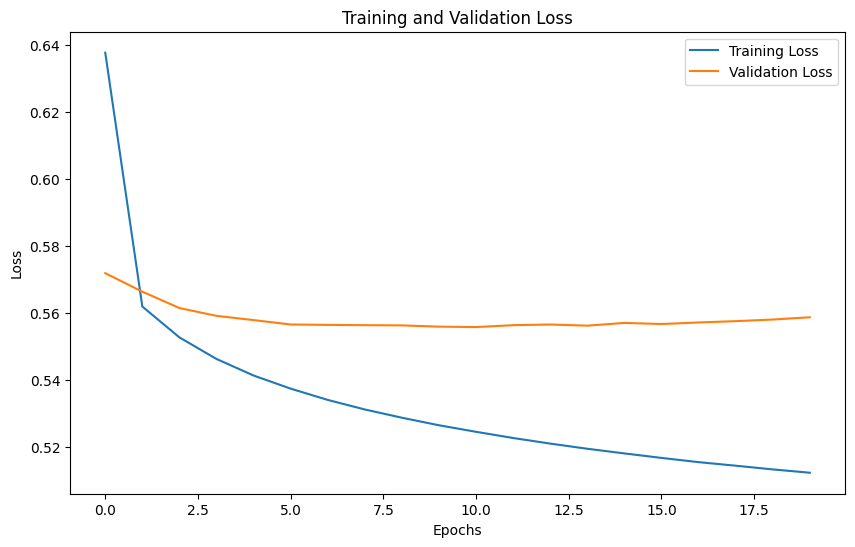

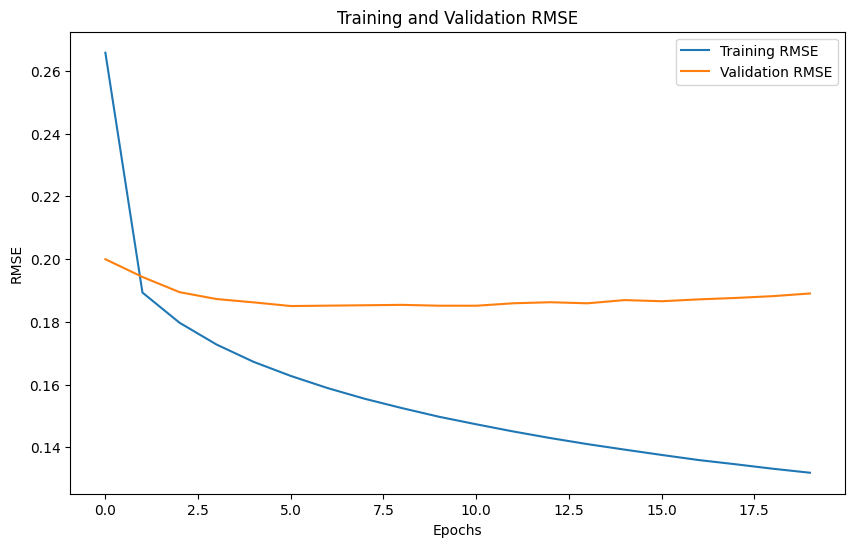

In [37]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history.history['root_mean_squared_error'], label='Training RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.show()


In [38]:
books_df = books
df = pd.read_csv('/content/book-recommendation-dataset/Ratings.csv')

# Mengambil sample user
user_id = df['User-ID'].sample(1).iloc[0]
book_read_by_user = df[df['User-ID'] == user_id]
book_not_read = books_df[~books_df['ISBN'].isin(book_read_by_user.ISBN.values)]['ISBN']
book_not_read = list(
    set(book_not_read)
    .intersection(set(isbn_to_isbn_encoded.keys()))
)

book_not_read = [[isbn_to_isbn_encoded.get(x)] for x in book_not_read]
user_encoder = id_to_id_encoded.get(user_id)
user_book_array = np.hstack(
    ([[user_encoder]] * len(book_not_read), book_not_read)
)

In [46]:
books_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [53]:
ratings = model.predict(user_book_array).flatten()

top_ratings_indices = ratings.argsort()[-10:][::-1]
recommended_book_isbns = [
    isbn_encoded_to_isbn.get(book_not_read[x][0]) for x in top_ratings_indices
]

print('Showing recommendations for users: {}'.format(user_id))
print('===' * 9)
print('Books with high ratings from user')
print('----' * 8)

top_book_user = (
    book_read_by_user.sort_values(
        by = 'Book-Rating',
        ascending=False
    )
    .head(5)
    .ISBN.values
)

book_df_rows = books_df[books_df['ISBN'].isin(top_book_user)]
for row in book_df_rows.itertuples():
    print(row._3, "-", row._2)

print('----' * 8)
print('Top 10 book recommendation')
print('----' * 8)

recommended_books = books_df[books_df['ISBN'].isin(recommended_book_isbns)]
for row in recommended_books.itertuples():
    print(f"{row._3} - '{row._2}' ({row._4}). {row.Publisher}.")

4682/4682 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step
Showing recommendations for users: 42408
Books with high ratings from user
--------------------------------
Sophie Kinsella - Shopaholic Takes Manhattan (Summer Display Opportunity)
SOPHIE KINSELLA - Confessions of a Shopaholic (Summer Display Opportunity)
Maeve Binchy - Tara Road
Jane Austen - Pride &amp; Prejudice
John Muir - How to Keep Your Volkswagen Alive 19 Ed: A Manual of Step-by-Step Procedures for the Compleat Idiot
--------------------------------
Top 10 book recommendation
--------------------------------
Paula Danziger - 'You Can't Eat Your Chicken Pox, Amber Brown (Amber Brown (Paperback))' (1996). Little Apple.
Bill Watterson - 'Calvin and Hobbes' (1987). Andrews McMeel Publishing.
Nora Roberts - 'Jewels of the Sun (Irish Trilogy)' (2004). Jove Books.
Robert Fleming - 'Scotland Yard' (1995). Signet.
Not Applicable (Na ) - 'Natural California: A Postcard Book' (1990). Running Pr.
Jane Davis - 'The Complete Guide to Beading Techni